<a href="https://colab.research.google.com/github/Musbell/dog-breed-classifier/blob/master/dog_app.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/sample_dog_output.png?raw=1)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home directory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [1]:
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip && unzip dogImages.zip && rm dogImages.zip
!wget https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip && unzip lfw.zip && rm lfw.zip 

Streaming output truncated to the last 5000 lines.
  inflating: lfw/Steffi_Graf/Steffi_Graf_0003.jpg  
  inflating: __MACOSX/lfw/Steffi_Graf/._Steffi_Graf_0003.jpg  
  inflating: lfw/Steffi_Graf/Steffi_Graf_0004.jpg  
  inflating: __MACOSX/lfw/Steffi_Graf/._Steffi_Graf_0004.jpg  
  inflating: lfw/Steffi_Graf/Steffi_Graf_0005.jpg  
  inflating: __MACOSX/lfw/Steffi_Graf/._Steffi_Graf_0005.jpg  
  inflating: __MACOSX/lfw/._Steffi_Graf  
   creating: lfw/Stella_Keitel/
  inflating: lfw/Stella_Keitel/Stella_Keitel_0001.jpg  
   creating: __MACOSX/lfw/Stella_Keitel/
  inflating: __MACOSX/lfw/Stella_Keitel/._Stella_Keitel_0001.jpg  
  inflating: __MACOSX/lfw/._Stella_Keitel  
   creating: lfw/Stella_McCartney/
  inflating: lfw/Stella_McCartney/Stella_McCartney_0001.jpg  
   creating: __MACOSX/lfw/Stella_McCartney/
  inflating: __MACOSX/lfw/Stella_McCartney/._Stella_McCartney_0001.jpg  
  inflating: __MACOSX/lfw/._Stella_McCartney  
   creating: lfw/Stella_Tennant/
  inflating: lfw/Stella_Tenn

In [1]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*"))
dog_files = np.array(glob("dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8351 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


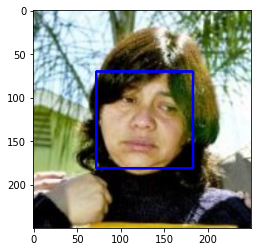

In [2]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [0]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [4]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
humans_detected = []
dogs_detected = []

def human_dog_detector(files, faces):
    for i in range(0, len(files)):
        face_identified = face_detector(files[i])
        if face_identified == True:
            faces.append(1)
        else: 
            faces.append(0)
        

human_dog_detector(human_files_short, humans_detected)
human_faces_detection_result = sum(humans_detected)/len(humans_detected)*100

human_dog_detector(dog_files_short, dogs_detected)
dog_faces_detection_result = sum(dogs_detected)/len(dogs_detected)*100


print(f'Human result: {human_faces_detection_result}%')
print(f'Dog result: {dog_faces_detection_result}%')


Human result: 99.0%
Dog result: 14.000000000000002%


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

# **Face Detection with Detectron2 (Optional)**

Reference: https://github.com/curiousily/Getting-Things-Done-with-Pytorch/blob/master/02.face-detection-with-detectron2.ipynb

In [57]:
### (Optional) 
### TODO: Test performance of another face detection algorithm.
### Feel free to use as many code cells as needed.


!pip install -q cython pyyaml==5.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

     |████████████████████████████████| 276kB 6.4MB/s 


In [58]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 4537, done.
remote: Total 4537 (delta 0), reused 0 (delta 0), pack-reused 4537
Receiving objects: 100% (4537/4537), 2.34 MiB | 4.09 MiB/s, done.
Resolving deltas: 100% (3209/3209), done.


In [0]:
!pip install -q -U watermark

In [5]:
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2

CPython 3.6.9
IPython 5.5.0

numpy 1.18.3
pandas 1.0.3
pycocotools 2.0
torch 1.5.0+cu101
torchvision 0.6.0+cu101
detectron2 0.1.1


In [6]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()


import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [7]:
%matplotlib inline
%config InlineBackend.figure_format='retina'


sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

In [8]:
## Download dataset
!gdown --id 1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS

Downloading...
From: https://drive.google.com/uc?id=1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS
To: /content/face_detection.json
100% 274k/274k [00:00<00:00, 43.0MB/s]


In [9]:
import pandas as pd

faces_df = pd.read_json('face_detection.json', lines=True)
faces_df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN


In [10]:
### Data Processing ###

import os
from tqdm import tqdm
import urllib
import PIL.Image as Image


os.makedirs("faces", exist_ok=True)

dataset = []

for index, row in tqdm(faces_df.iterrows(), total=faces_df.shape[0]):
    img = urllib.request.urlopen(row["content"])
    img = Image.open(img)
    img = img.convert('RGB')

    image_name = f'face_{index}.jpeg'

    img.save(f'faces/{image_name}', "JPEG")
    
    annotations = row['annotation']
    for an in annotations:

      data = {}

      width = an['imageWidth']
      height = an['imageHeight']
      points = an['points']

      data['file_name'] = image_name
      data['width'] = width
      data['height'] = height

      data["x_min"] = int(round(points[0]["x"] * width))
      data["y_min"] = int(round(points[0]["y"] * height))
      data["x_max"] = int(round(points[1]["x"] * width))
      data["y_max"] = int(round(points[1]["y"] * height))

      data['class_name'] = 'face'

      dataset.append(data)

100%|██████████| 409/409 [03:31<00:00,  1.94it/s]


In [11]:
df = pd.DataFrame(dataset)
df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,face_0.jpeg,650,333,56,102,112,151,face
1,face_0.jpeg,650,333,379,97,428,156,face
2,face_1.jpeg,1280,697,903,162,985,252,face
3,face_2.jpeg,460,240,216,12,279,80,face
4,face_2.jpeg,460,240,289,2,343,74,face


In [12]:
print(df.file_name.unique().shape[0], df.shape[0])

409 1132


In [0]:
df.to_csv('annotations.csv', header=True, index=None)

In [0]:
# Sample annotated data
def annotate_image(annotations, resize=True):
  file_name = annotations.file_name.to_numpy()[0]
  img = cv2.cvtColor(cv2.imread(f'faces/{file_name}'), cv2.COLOR_BGR2RGB)

  for i, a in annotations.iterrows():    
    cv2.rectangle(img, (a.x_min, a.y_min), (a.x_max, a.y_max), (0, 255, 0), 2)

  if not resize:
    return img

  return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

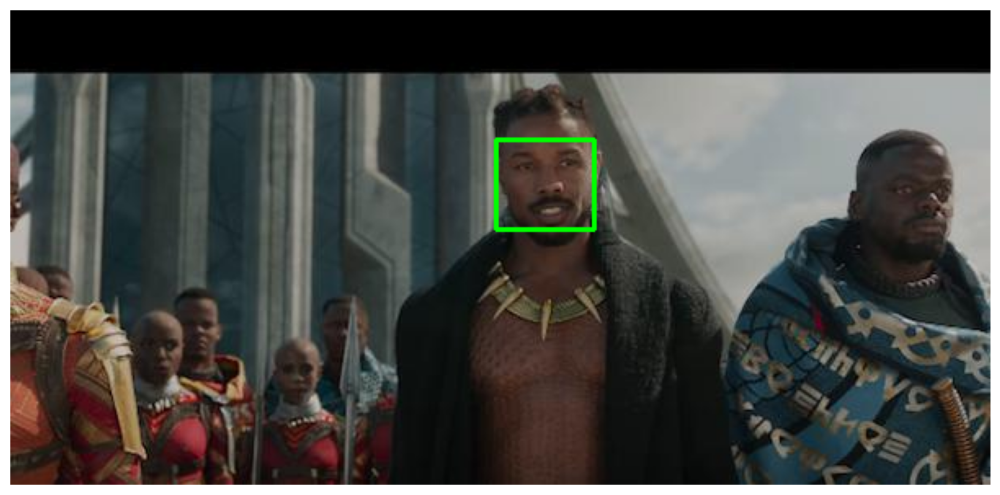

In [15]:
img_df = df[df.file_name == df.file_name.unique()[3]]
img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

In [0]:
# Split dataset

unique_files = df.file_name.unique()

train_files = set(
    np.random.choice(unique_files, int(len(unique_files) * 0.95), replace=False)
)

In [17]:
train_df = df[df.file_name.isin(train_files)]
test_df = df[-df.file_name.isin(train_files)]

print(train_df.shape, test_df.shape)

(1062, 8) (70, 8)


In [0]:
classes = df.class_name.unique().tolist()

In [0]:
IMAGES_PATH = f'faces'

In [0]:
import itertools
from detectron2.structures import BoxMode

def create_dataset_dicts(df, classes):
  dataset_dicts = []
  for image_id, img_name in enumerate(df.file_name.unique()):

    record = {}

    image_df = df[df.file_name == img_name]

    file_path = f'{IMAGES_PATH}/{img_name}'
    record["file_name"] = file_path
    record["image_id"] = image_id
    record["height"] = int(image_df.iloc[0].height)
    record["width"] = int(image_df.iloc[0].width)

    objs = []
    for _, row in image_df.iterrows():

      xmin = int(row.x_min)
      ymin = int(row.y_min)
      xmax = int(row.x_max)
      ymax = int(row.y_max)

      poly = [
          (xmin, ymin), (xmax, ymin), 
          (xmax, ymax), (xmin, ymax)
      ]
      poly = list(itertools.chain.from_iterable(poly))

      obj = {
        "bbox": [xmin, ymin, xmax, ymax],
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": [poly],
        "category_id": classes.index(row.class_name),
        "iscrowd": 0
      }
      objs.append(obj)

    record["annotations"] = objs
    dataset_dicts.append(record)
  return dataset_dicts

In [0]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader

# Register dataset into the dataset and metadata catalogues
for d in ["train", "val"]:
  DatasetCatalog.register("faces_" + d, lambda d=d: create_dataset_dicts(train_df if d == "train" else test_df, classes))
  MetadataCatalog.get("faces_" + d).set(thing_classes=classes)

statement_metadata = MetadataCatalog.get("faces_train")

In [0]:
from detectron2.engine import DefaultPredictor, DefaultTrainer

class CocoTrainer(DefaultTrainer):
  
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [0]:
cfg = get_cfg()

cfg.merge_from_file(
  model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
  )
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
  "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
)

In [0]:
cfg.DATASETS.TRAIN = ("faces_train",)
cfg.DATASETS.TEST = ("faces_val",)
cfg.DATALOADER.NUM_WORKERS = 4

In [0]:
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

In [0]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 500

In [27]:
# Train model
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
# trainer.train()

[05/04 05:04:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:38, 11.3MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


In [0]:
%load_ext tensorboard
%tensorboard --logdir output

using Pretarined Model

In [28]:
!gdown --id 18Ev2bpdKsBaDufhVKf0cT6RmM3FjW3nL
!mv face_detector.pth output/model_final.pth

Downloading...
From: https://drive.google.com/uc?id=18Ev2bpdKsBaDufhVKf0cT6RmM3FjW3nL
To: /content/face_detector.pth
856MB [00:04, 171MB/s]


In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

In [30]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

evaluator = COCOEvaluator("faces_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "faces_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/04 05:05:48 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'faces_val'. Trying to convert it to COCO format ...
[05/04 05:05:48 d2.data.datasets.coco]: Converting annotations of dataset 'faces_val' to COCO format ...)
[05/04 05:05:48 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[05/04 05:05:48 d2.data.datasets.coco]: Conversion finished, num images: 21, num annotations: 70
[05/04 05:05:48 d2.data.datasets.coco]: Caching COCO format annotations at './output/faces_val_coco_format.json' ...
[05/04 05:05:48 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    face    | 70           |
|            |              |
[05/04 05:05:48 d2.data.common]: Serializing 21 elements to byte tensors and concatenating them all ...
[05/04 05:05:48 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/04 05:05:48 d2.evaluation.evaluator]: Start inference on 21 image

OrderedDict([('bbox',
              {'AP': 0.10592520228808425,
               'AP50': 0.4805459657924088,
               'AP75': 0.011322765716216399,
               'APl': 0.10207644803520693,
               'APm': 0.20231714178341687,
               'APs': 0.1155115511551155}),
             ('segm',
              {'AP': 0.09252652275153785,
               'AP50': 0.4805459657924088,
               'AP75': 0.011322765716216399,
               'APl': 0.10721503762988487,
               'APm': 0.23588660358233224,
               'APs': 0.0})])

In [0]:
os.makedirs("annotated_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [0]:
import ntpath
from detectron2.utils.visualizer import Visualizer, ColorMode

for clothing_image in test_image_paths:
  file_path = f'{IMAGES_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'annotated_results/{file_name}', result)

In [0]:
annotated_images = [f'annotated_results/{f}' for f in test_df.file_name.unique()]

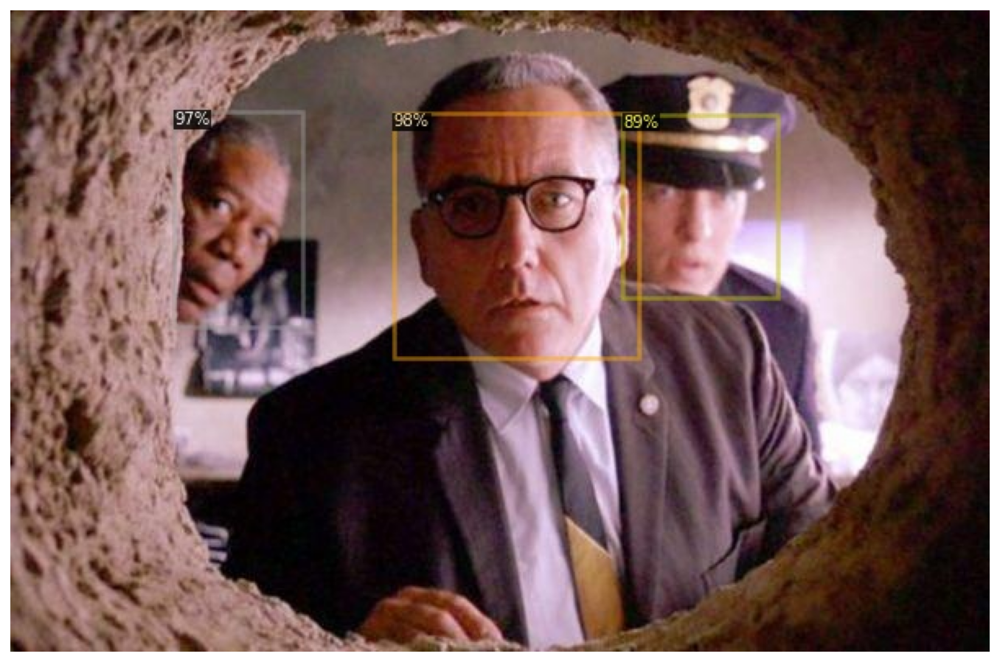

In [34]:
img = cv2.cvtColor(cv2.imread(annotated_images[3]), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off');

In [0]:
os.makedirs("human_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [0]:
for clothing_image in human_files[:10]:
  im = cv2.imread(clothing_image)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'human_results/{file_name}', result)

In [0]:
human_annotated_results = np.array(glob("human_results/*"))

In [38]:
human_annotated_images = [f'{f}' for f in human_annotated_results[:10]]
human_annotated_images

['human_results/Imre_Kertasz_0001.jpg',
 'human_results/Scott_Dalton_0001.jpg',
 'human_results/Rosalie_Perkov_0001.jpg',
 'human_results/Martha_Martinez_Flores_0001.jpg',
 'human_results/Michael_Diekmann_0001.jpg',
 'human_results/Tessa_Jowell_0001.jpg',
 'human_results/Alan_Ball_0002.jpg',
 'human_results/Infanta_Cristina_0001.jpg',
 'human_results/Alan_Ball_0001.jpg',
 'human_results/Elias_Attallah_0001.jpg']

In [0]:
os.makedirs("Dog_results", exist_ok=True)

for clothing_image in dog_files[:10]:
  im = cv2.imread(clothing_image)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'Dog_results/{file_name}', result)

In [0]:
dog_annotated_results = np.array(glob("Dog_results/*"))

In [41]:
dog_annotated_images = [f'{f}' for f in dog_annotated_results[:10]]
dog_annotated_images

['Dog_results/Portuguese_water_dog_07971.jpg',
 'Dog_results/Portuguese_water_dog_07984.jpg',
 'Dog_results/Havanese_05574.jpg',
 'Dog_results/Havanese_05576.jpg',
 'Dog_results/Havanese_05614.jpg',
 'Dog_results/Havanese_05625.jpg',
 'Dog_results/Havanese_05585.jpg',
 'Dog_results/Portuguese_water_dog_07975.jpg',
 'Dog_results/Havanese_05566.jpg',
 'Dog_results/Portuguese_water_dog_07963.jpg']

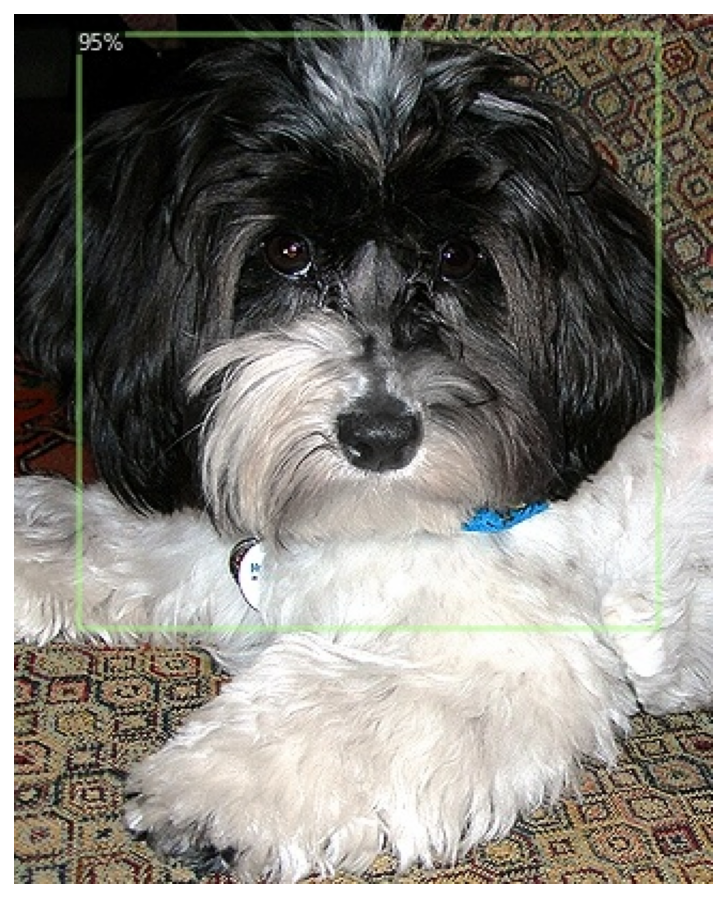

In [0]:
dog_img = cv2.cvtColor(cv2.imread(dog_annotated_images[4]), cv2.COLOR_BGR2RGB)

plt.imshow(dog_img)
plt.axis('off');

**Performance Report**

In [42]:
def face_recognition_alg(file_path):
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")

  value = len(instances.get_fields()['pred_boxes'])

  return value

humans_identified = []
dogs_identified = []

#get human face recognition results
for i in range(0, len(human_files_short)):
    value = face_recognition_alg(human_files_short[i])
    if value == True:
        humans_identified.append(1)
    else:
        humans_identified.append(0)
humans_score = sum(humans_identified)/len(humans_identified)*100

#get dog face recognition results
for i in range(0, len(dog_files_short)):
    value = face_recognition_alg(dog_files_short[i])
    if value == True:
        dogs_identified.append(1)
    else:
        dogs_identified.append(0)

dogs_score = sum(dogs_identified)/len(dogs_identified)*100

print(f'humans_score: {humans_score}%')
print(f'dogs_score: {dogs_score}%')

humans_score: 93.0%
dogs_score: 23.0%


---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [0]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [0]:
from PIL import Image
import torchvision.transforms as transforms

# Set PIL to be tolerant of image files that are truncated.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    img = Image.open(img_path)

    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
    
    pre_process = transforms.Compose([
        transforms.RandomRotation(30),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    image_tensor = pre_process(img).unsqueeze(0)
    
    if use_cuda:
      image_tensor = image_tensor.cuda()

    VGG16.eval()

    with torch.no_grad():
      logps = VGG16(image_tensor)
      prediction = torch.argmax(logps).item()

    VGG16.train()

    return prediction # predicted class index

In [45]:
VGG16_predict(dog_annotated_images[1])  

221

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [0]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    dog_detection = VGG16_predict(img_path)
    return True if 151 <= dog_detection <= 268 else False # true/false

In [47]:
dog_detector(dog_annotated_images[9]) 

False

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 
Dogs detected in human files short: 8.0%, 
Dogs detected in dog files short: 99.0%

In [0]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
VGG16_dogs_in_human_detection_counter = 0

for human_file_path in human_files_short:
  if dog_detector(human_file_path):
    VGG16_dogs_in_human_detection_counter += 1

VGG16_dogs_in_dog_detection_counter = 0

for dog_file_path in dog_files_short:
  if dog_detector(dog_file_path):
    VGG16_dogs_in_dog_detection_counter += 1

print(f'Dogs detected in human files short: {VGG16_dogs_in_human_detection_counter/len(human_files_short)*100}%')

print(f'Dogs detected in dog files short: {VGG16_dogs_in_dog_detection_counter/len(dog_files_short)*100}%')

Dogs detected in human files short: 8.0%
Dogs detected in dog files short: 99.0%


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [0]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.  

def pretrained_network(pre_trained_model, image_path):
  if use_cuda:
    pre_trained_model.cuda()

  img = Image.open(image_path)

  normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
    
  pre_process = transforms.Compose([
        transforms.RandomRotation(30),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

  image_tensor = pre_process(img).unsqueeze(0)
    
  if use_cuda:
      image_tensor = image_tensor.cuda()

  pre_trained_model.eval()

  with torch.no_grad():
      logps = pre_trained_model(image_tensor)
      prediction = torch.argmax(logps).item()

  pre_trained_model.train()

  return prediction


def _dog_detector_helper(pre_trained_model, image_path):
    dog_detection = pretrained_network(pre_trained_model,image_path)
    return True if 151 <= pretrained_network(pre_trained_model, image_path) <= 268 else False

def dog_detector_scanner(pre_trained_model, human_files_short=human_files_short, dog_files_short=dog_files_short):
   dogs_in_human_detection_counter = 0
   dogs_in_dog_detection_counter = 0

   for file_path in human_files_short:
      if _dog_detector_helper(pre_trained_model, file_path):
        dogs_in_human_detection_counter += 1

   print(f'Dogs detected in human files short: {dogs_in_human_detection_counter/len(human_files_short)*100}%')

   for file_path in dog_files_short:
      if _dog_detector_helper(pre_trained_model, file_path):
        dogs_in_dog_detection_counter += 1

   print(f'Dogs detected in dog files short: {dogs_in_dog_detection_counter/len(dog_files_short)*100}%')

In [0]:
# ResNet50
ResNet50 = models.resnet50(pretrained=True)
dog_detector_scanner(ResNet50)

print('------------------------------')

# InceptionV3
InceptionV3 = models.inception_v3(pretrained=True)
dog_detector_scanner(InceptionV3)


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth



Dogs detected in human files short: 1.0%
Dogs detected in dog files short: 98.0%
------------------------------


Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth



Dogs detected in human files short: 4.0%
Dogs detected in dog files short: 96.0%


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Brittany_02625.jpg?raw=1" width="100"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Welsh_springer_spaniel_08203.jpg?raw=1" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Curly-coated_retriever_03896.jpg?raw=1" width="200"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/American_water_spaniel_00648.jpg?raw=1" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06457.jpg?raw=1" width="150"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06455.jpg?raw=1" width="240"> | <img src="https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/Labrador_retriever_06449.jpg?raw=1" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [53]:
import os
import numpy as np
import torch
from torchvision import datasets
import torchvision.transforms as transforms

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

data_dir = 'dogImages'

num_workers = 8
batch_size = 64

num_workers_test = 0
batch_size_test = int(np.floor(batch_size/5))

norm_mean = [0.485, 0.456, 0.406]
norm_std = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
                    transforms.Resize(256),
                    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
                    transforms.RandomHorizontalFlip(),
                    transforms.RandomResizedCrop(224, scale=(0.08,1), ratio=(1,1)), 
                    transforms.ToTensor(),
                    transforms.Normalize(mean = norm_mean, std = norm_std)])

test_transforms = transforms.Compose([
                    transforms.Resize(256),  
                    transforms.FiveCrop(224),
                    transforms.Lambda(lambda crops: torch.stack([transforms.Compose([
                    transforms.ToTensor(),transforms.Normalize(mean = norm_mean, std = norm_std)])(crop) for crop in crops]))])


train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'train'), transform=train_transforms)
valid_dataset = datasets.ImageFolder(os.path.join(data_dir, 'valid'), transform=test_transforms)
test_dataset = datasets.ImageFolder(os.path.join(data_dir, 'test'), transform=test_transforms)


train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                           num_workers=num_workers, shuffle=True, pin_memory=True)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size_test,
                                           num_workers=num_workers_test, shuffle=True, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size_test,
                                          num_workers=num_workers_test, shuffle=True, pin_memory=True)

loaders_scratch = {'train': train_loader,
                   'valid': valid_loader,
                   'test': test_loader}
                   
len(train_dataset.classes)

133

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:


*  I picked the size of 224x224 px as input tensor based of my findings, which i think it will be more easier to compare with other pretrained models in terms of performance. In some other resources,  rescaling of the orignial image before cropping is necessary, because without that, the network might learn a different pattern which might miss out the obvious ones needed for the classification.
*   Yes, and that is because augmenting the image data by random horizontal flipping makes the network sees the dogs facing both left and right randomly, which is generally applicable in real life senerio. I also used color jitter transform to make the network sensible enough to classify well irrespective of any given image quality.



### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [0]:
import torch.nn as nn
import torch.nn.functional as F

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    
    # Reference: https://github.com/mirceast/cnn-dog-breed-classifier/blob/master/from_scratch.ipynb

    def __init__(self):
        super().__init__()
        ## Define layers of a CNN

        depth_1 = 32
        depth_2 = depth_1 * 2
        depth_3 = depth_2 * 2   
        img_input_size = 224   
        weight_init = True
        n_classes = 133
        p_dropout_pool = 0

        # Max pooling layer
        self.pool = nn.MaxPool2d(2,2)
        # Conv set 1
        self.conv1_1 = nn.Conv2d(3,depth_1,3,stride = 1,padding = 1)
        self.conv1_2 = nn.Conv2d(depth_1,depth_1,3,stride = 1,padding = 1)
        # Conv set 2
        self.conv2_1 = nn.Conv2d(depth_1,depth_2,3,stride = 1,padding = 1)
        self.conv2_2 = nn.Conv2d(depth_2,depth_2,3,stride = 1,padding = 1)
        # Conv set 3
        self.conv3_1 = nn.Conv2d(depth_2,depth_3,3,stride = 1,padding = 1)
        self.conv3_2 = nn.Conv2d(depth_3,depth_3,3,stride = 1,padding = 1)
        self.fc_out = nn.Linear(depth_3,n_classes)
        # Dropout
        self.dropout = nn.Dropout(p = 0)
        # Linear layer to replace global pooling. Input vector will be (mean, std, min, max) x depth_3 size
        self.fc_pool_1 = nn.Linear(depth_3 * 4, n_classes)
        self.fc_pool_2 = nn.Linear(n_classes,n_classes)
        self.fc_pool_out = nn.Linear(n_classes, n_classes)
        self.dropout_pool = nn.Dropout(p = p_dropout_pool)  

        # Initialize weights
        if weight_init:
            nn.init.kaiming_normal_(self.conv1_1.weight, nonlinearity='relu')
            nn.init.kaiming_normal_(self.conv1_2.weight, nonlinearity='relu')
            nn.init.kaiming_normal_(self.conv2_1.weight, nonlinearity='relu')
            nn.init.kaiming_normal_(self.conv2_2.weight, nonlinearity='relu')
            nn.init.kaiming_normal_(self.conv3_1.weight, nonlinearity='relu')
            nn.init.kaiming_normal_(self.conv3_2.weight, nonlinearity='relu')

    
    def forward(self, x):
        ## Define forward behavior
        # add sequence of convolutional and max pooling layers
        # Conv 1
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = self.pool(x)
        # Conv 2
        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = self.pool(x)
        # Conv 3
        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = self.pool(x)
       
        x = x.view(x.size(0),x.size(1),-1)

        x = x.max(2)[0]

        # Output
        x = self.dropout(x)
        x = self.fc_out(x)

        return x

#-#-# You do NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

model_scratch

Net(
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1_1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1_2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc_out): Linear(in_features=128, out_features=133, bias=True)
  (dropout): Dropout(p=0, inplace=False)
  (fc_pool_1): Linear(in_features=512, out_features=133, bias=True)
  (fc_pool_2): Linear(in_features=133, out_features=133, bias=True)
  (fc_pool_out): Linear(in_features=133, out_features=133, bias=True)
  (dropout_pool): Dropout(p=0, inplace=False)
)

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

After reading from the above stated referenced link, i discorvered that the architecture used by the author is inspired by the VGG networks, with three sets of two convolutional layers each, followed by max pooling. The initial depth of 32 is doubled after each set. 

The author replaces the fully connected layers at the end with global **max** pooling. He emphasized that, most popular architectures replaced fully connected layers with global **average** pooling which he beleive it contradicts the philosophy of convolutional nets. Global **max** pooling enables the network to detect a relevant pattern wherever in the image it might be; not on how many locations did not have the pattern.

For these reasons, i chose to use these steps with Kaiming initialization, which significantly outperformed other steps i have tried so far.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [0]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = nn.CrossEntropyLoss()

### TODO: select optimizer
optimizer_scratch = optim.Adam(model_scratch.parameters(),lr=0.0012)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [0]:
# the following import is required for training to be robust to truncated images
import numpy as np

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## find the loss and update the model parameters accordingly
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))

            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # train_loss += loss.item() * data.size(0)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss
            train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        with torch.no_grad():
          for batch_idx, (data, target) in enumerate(loaders['valid']):
              # move to GPU
              if use_cuda:
                  data, target = data.cuda(), target.cuda()
              ## update the average validation loss
              # forward pass: compute predicted outputs by passing inputs to the model
              
              bs, ncrops, c, h, w = data.size()
              output = model(data.view(-1, c, h, w)) # fuse batch size and ncrops
              output = output.view(bs, ncrops, -1).mean(1)


              # calculate the loss
              loss = criterion(output, target)
              # valid_loss += loss.item() * data.size(0)
              # update running validation loss 
              valid_loss = valid_loss + ((1 / (batch_idx + 1)) * (loss.data - valid_loss))

            
        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            train_loss,
            valid_loss
            ))
        
        ## TODO: save the model if validation loss has decreased
        if valid_loss <= valid_loss_min:
          print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
          valid_loss_min,
          valid_loss))
          torch.save(model.state_dict(), 'model_scratch.pt')
          valid_loss_min = valid_loss
            
    # return trained model
    return model

loaders_scratch = {'train': train_loader,
                   'valid': valid_loader,
                   'test': test_loader}

# train the model
model_scratch = train(100, loaders_scratch, model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 	Training Loss: 4.897963 	Validation Loss: 4.860984
Validation loss decreased (inf --> 4.860984).  Saving model ...
Epoch: 2 	Training Loss: 4.835935 	Validation Loss: 4.763759
Validation loss decreased (4.860984 --> 4.763759).  Saving model ...
Epoch: 3 	Training Loss: 4.726571 	Validation Loss: 4.652954
Validation loss decreased (4.763759 --> 4.652954).  Saving model ...
Epoch: 4 	Training Loss: 4.654665 	Validation Loss: 4.694153
Epoch: 5 	Training Loss: 4.542149 	Validation Loss: 4.401156
Validation loss decreased (4.652954 --> 4.401156).  Saving model ...
Epoch: 6 	Training Loss: 4.436950 	Validation Loss: 4.350326
Validation loss decreased (4.401156 --> 4.350326).  Saving model ...
Epoch: 7 	Training Loss: 4.303098 	Validation Loss: 4.223641
Validation loss decreased (4.350326 --> 4.223641).  Saving model ...
Epoch: 8 	Training Loss: 4.185428 	Validation Loss: 4.029937
Validation loss decreased (4.223641 --> 4.029937).  Saving model ...
Epoch: 9 	Training Loss: 4.111157 

<All keys matched successfully>

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [0]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()  
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        bs, ncrops, c, h, w = data.size()
        output = model(data.view(-1, c, h, w)) # fuse batch size and ncrops
        output = output.view(bs, ncrops, -1).mean(1)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

# call test function    
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 1.918730


Test Accuracy: 49% (417/836)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [0]:
## TODO: Specify data loaders
loaders_transfer = loaders_scratch

### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [0]:
import torchvision.models as models
import torch.nn as nn

## TODO: Specify model architecture 

model_transfer = models.vgg16(pretrained=True)

for param in model_transfer.parameters():
    param.requires_grad = False

n_classes = len(train_dataset.classes)


model_transfer.classifier[6] = nn.Linear(model_transfer.classifier[6].in_features,n_classes)
nn.init.kaiming_normal_(model_transfer.classifier[6].weight, nonlinearity='relu')

model_transfer = model_transfer.cuda()

__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 

VGG16 network is known to be tained on dogs among other classes of things. However, among other VGG models, they achieved top performance in the ILSVRC 2014 competition and because the modular structure of the architecture is easy to understand and implement. They contain useful high level feature information in the later convolutional layers.

using residual connections and replacing the fully connected layers with global average pooling, allow it to be deeper than other architectures.

Therefore, i only replaced the final layer and used the Kaiming initialization which really enhance the perfomance of the model as recommended from the reference stated above in the model architecture secion (from Scratch).


### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [0]:
import torch.optim as optim
criterion_transfer = nn.CrossEntropyLoss()
optimizer_transfer = optim.SGD(model_transfer.parameters(), lr=0.001)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [0]:
# train the model
model_transfer = train(100, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

# load the model that got the best validation accuracy (uncomment the line below)
model_transfer.load_state_dict(torch.load('model_transfer.pt'))

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [0]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.520685


Test Accuracy: 85% (712/836)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [0]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item[4:].replace("_", " ") for item in train_dataset.classes]

model_transfer.load_state_dict(torch.load('model_transfer.pt'))

def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    image = Image.open(img_path).convert('RGB')

    preprocess = transforms.Compose([
                        transforms.Resize(256),  
                        transforms.FiveCrop(224),
                        transforms.Lambda(lambda crops: torch.stack([transforms.Compose([
                    transforms.ToTensor(),transforms.Normalize(mean = norm_mean, std = norm_std)])(crop) for crop in crops]))])  

  
    img_tensor = preprocess(image)

    if use_cuda:
        img_tensor = img_tensor.cuda()
        
    model_transfer.eval()
    
    with torch.no_grad():
        output = model_transfer(img_tensor).mean(0)
        prediction = torch.argmax(output).item()
 
    model_transfer.train()
    
    breed = class_names[prediction]
    
    return breed

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](https://github.com/udacity/deep-learning-v2-pytorch/blob/master/project-dog-classification/images/sample_human_output.png?raw=1)


### (IMPLEMENTATION) Write your Algorithm

In [0]:
import cv2
from PIL import Image


# check if CUDA is available
use_cuda = torch.cuda.is_available()


### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

def run_app(img_path):
  
    if face_detector(img_path):
        print('Hello Human!')
        plt.imshow(Image.open(img_path))
        plt.show()
        print(f'You look like a ... {predict_breed_transfer(img_path)}')
        print('\n-----------------------------------\n')
    elif dog_detector(img_path):
        plt.imshow(Image.open(img_path))
        plt.show()
        print(f'This is a picture of a ... {predict_breed_transfer(img_path)}')
        print('\n-----------------------------------\n')
    else:
        plt.imshow(Image.open(img_path))
        plt.show()
        print('Sorry, I did not detect a human or a dog in this image.')
        print('\n-----------------------------------\n')


---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)

The output is quite good but not that perfect. Funny enough the model sees most monkeys as humans and unable to classify Nigeria local dogs :)

*   I need to improve both the human and dog detector i.e. increase the epochs and add more classes of images of other dog breeds from other part of the world.
*  Use transfer learning on the dog detector to increase accuracy

* Extraction of color patterns in the image (using color histograms) could also improve the performance.

Hello Human!


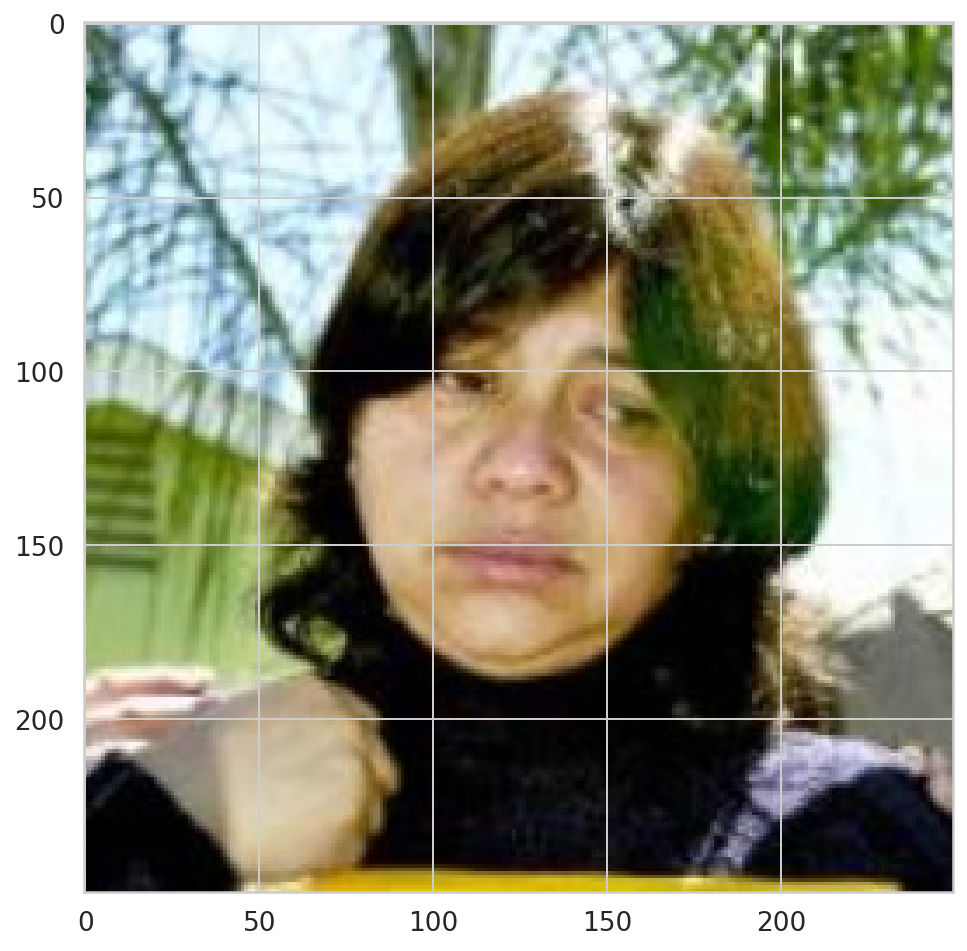

You look like a ... Cavalier king charles spaniel

-----------------------------------

Hello Human!


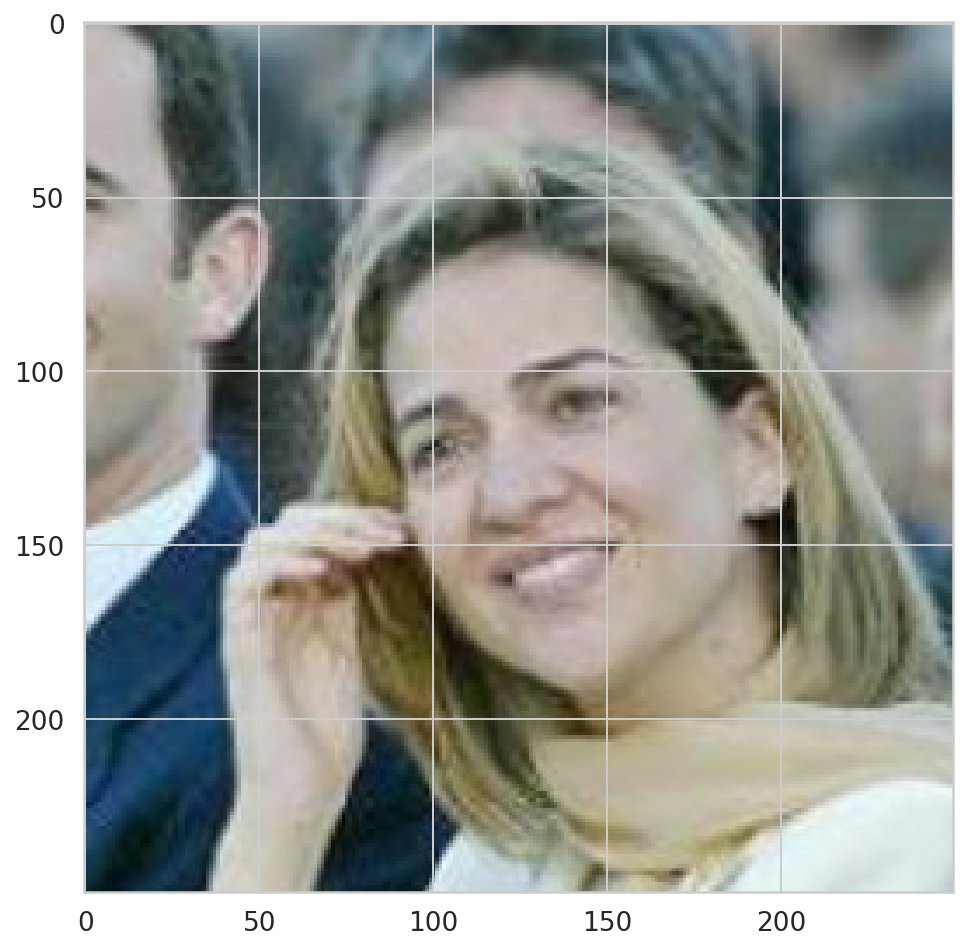

You look like a ... Chinese crested

-----------------------------------

Hello Human!


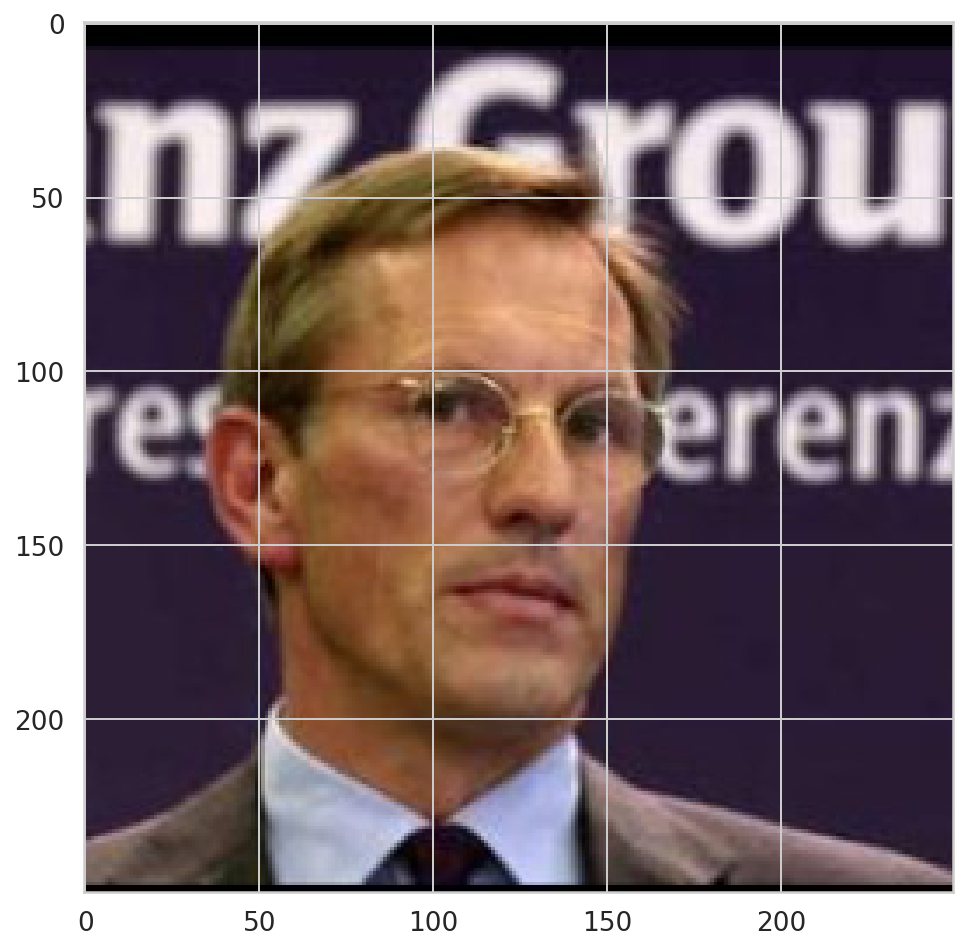

You look like a ... Brittany

-----------------------------------

Hello Human!


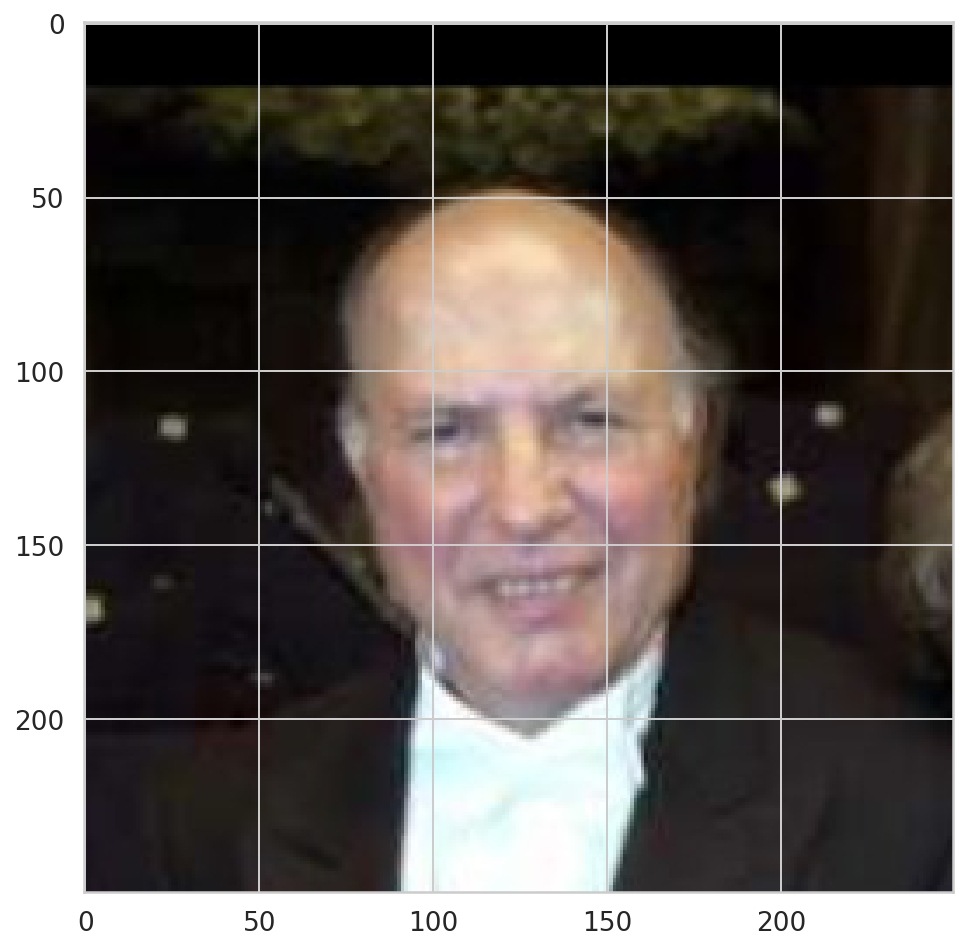

You look like a ... Brittany

-----------------------------------

Hello Human!


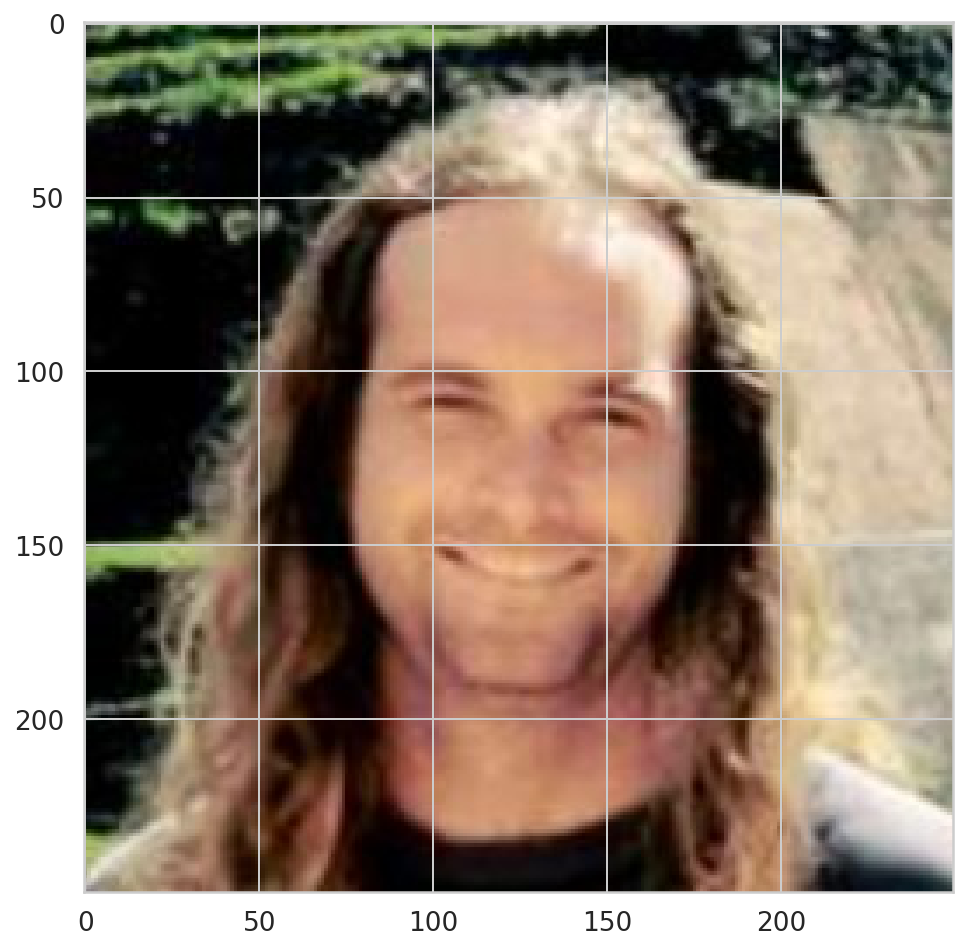

You look like a ... Irish water spaniel

-----------------------------------

Hello Human!


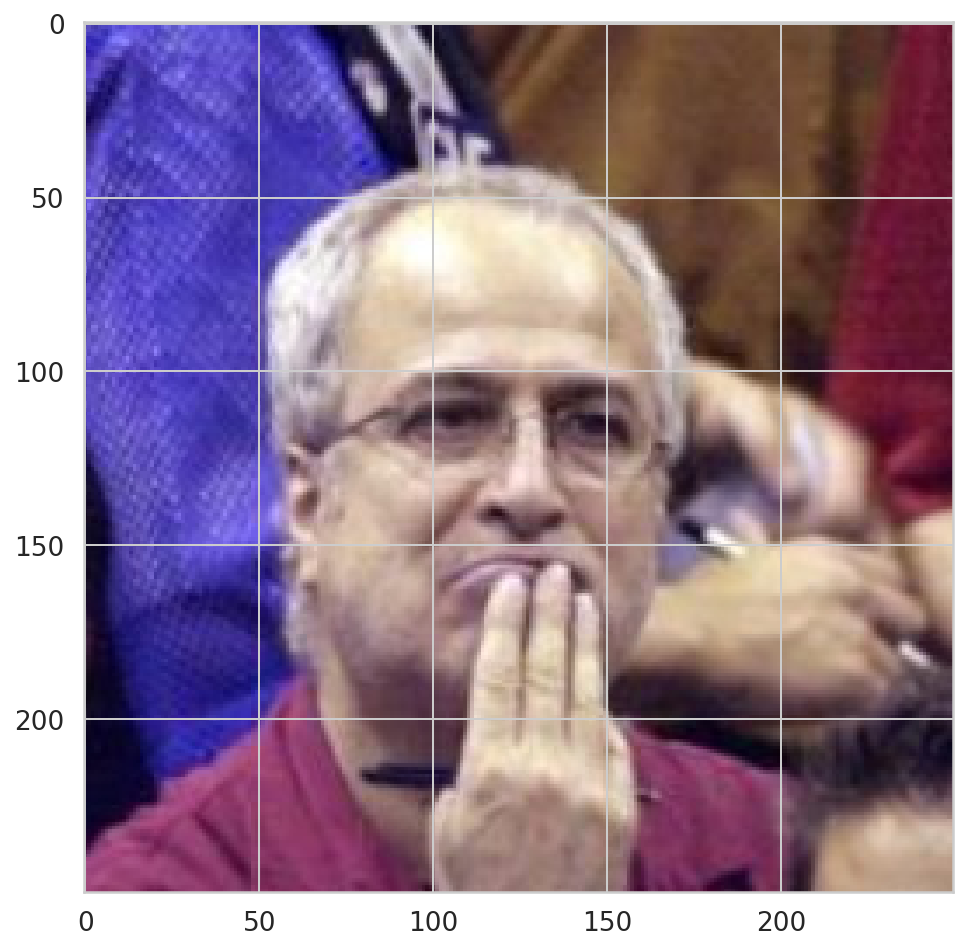

You look like a ... Italian greyhound

-----------------------------------



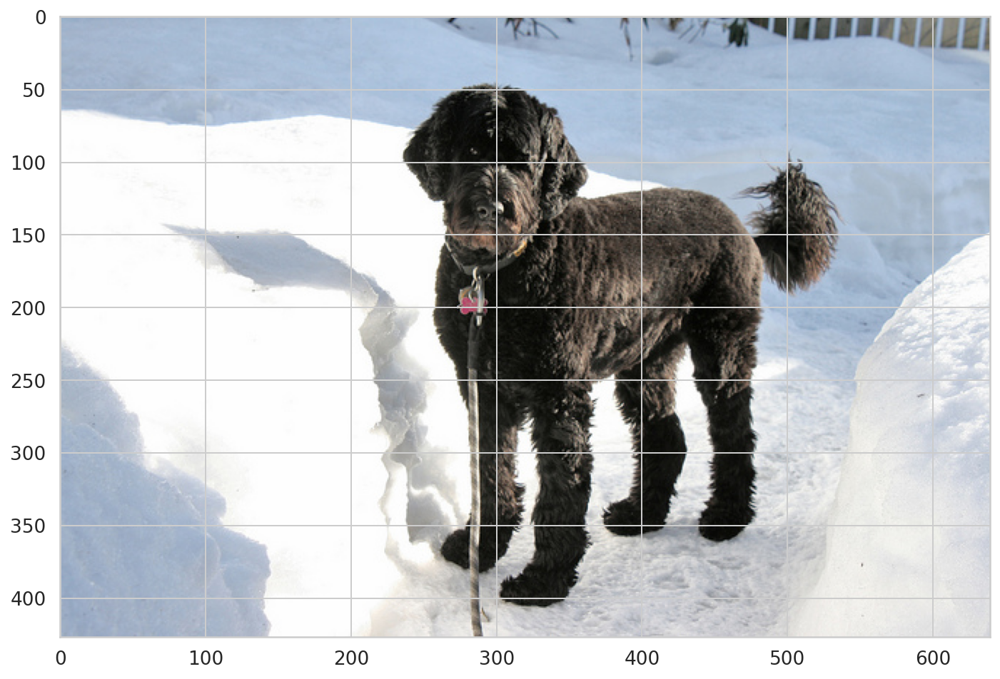

This is a picture of a ... Portuguese water dog

-----------------------------------



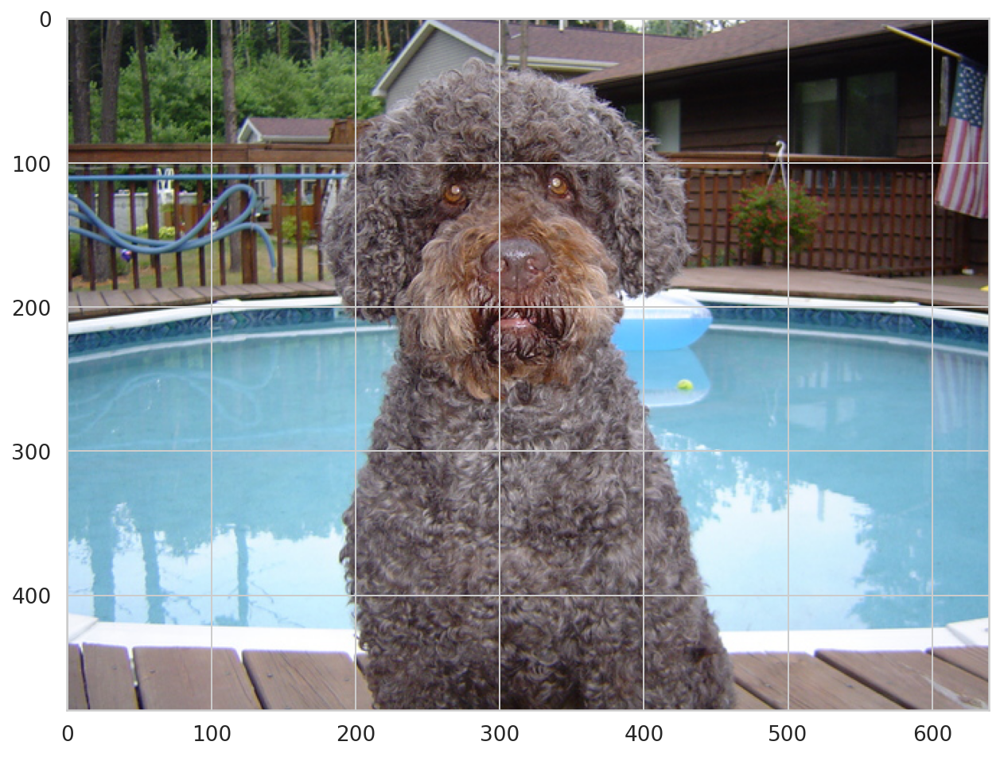

This is a picture of a ... Irish water spaniel

-----------------------------------



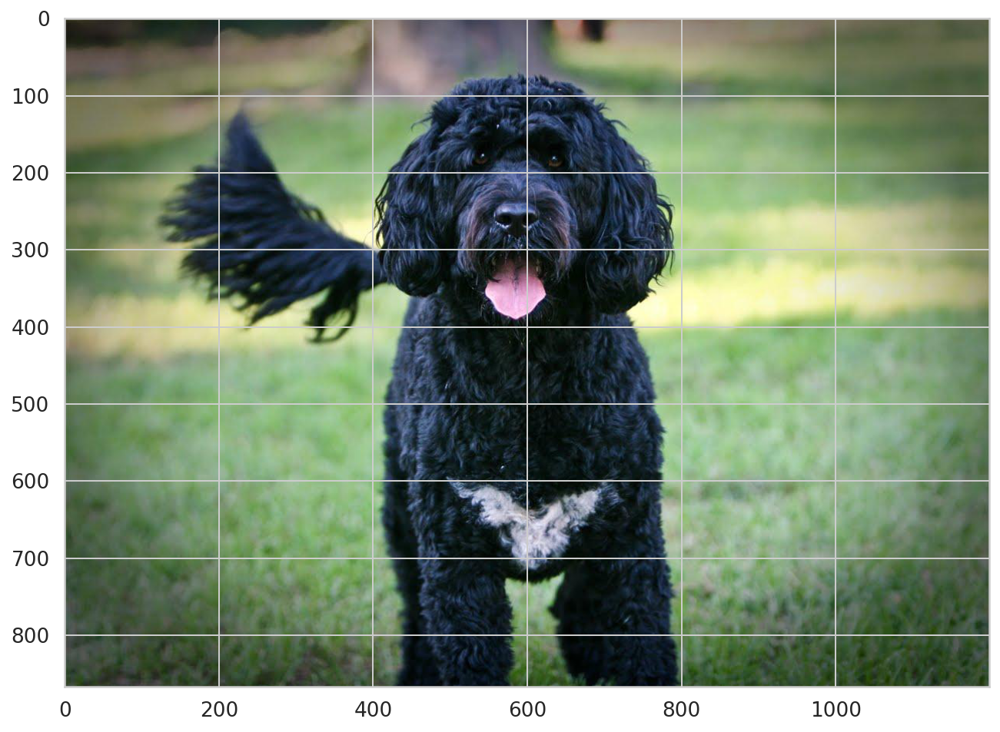

This is a picture of a ... Portuguese water dog

-----------------------------------



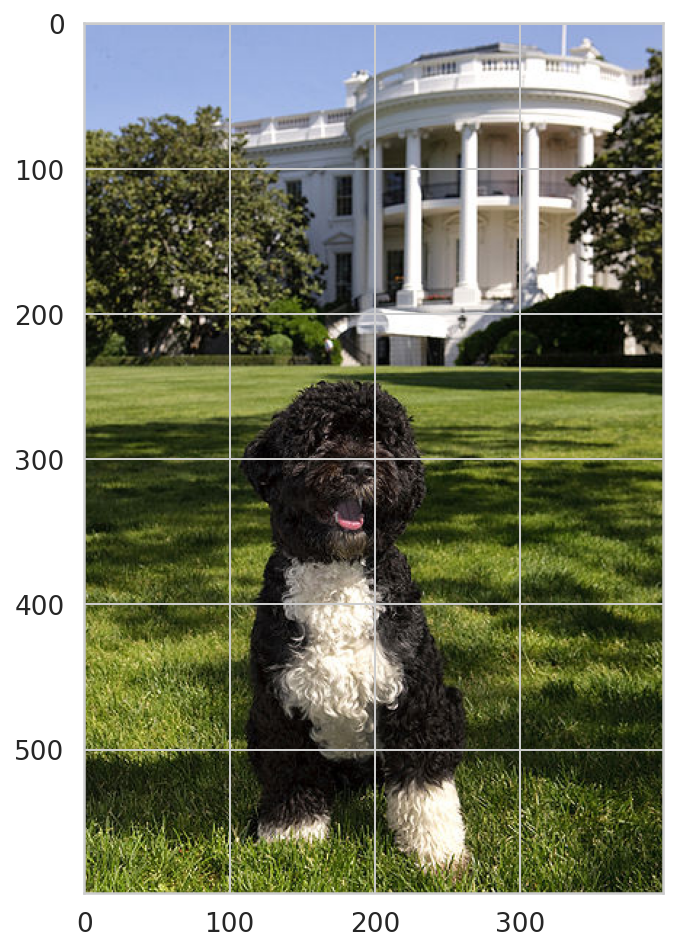

This is a picture of a ... Portuguese water dog

-----------------------------------



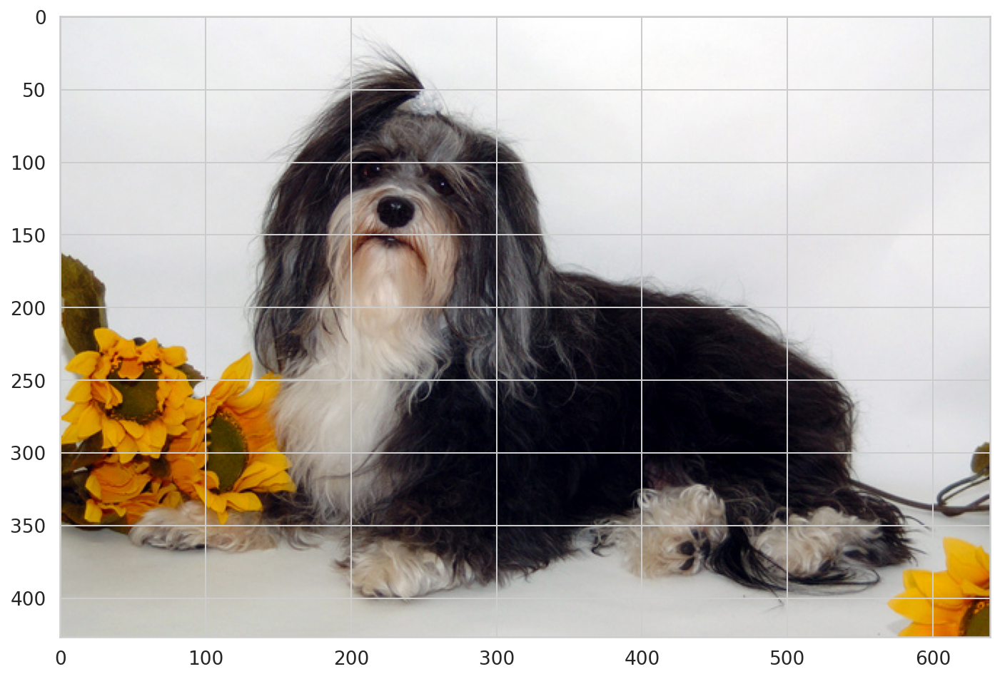

This is a picture of a ... Havanese

-----------------------------------



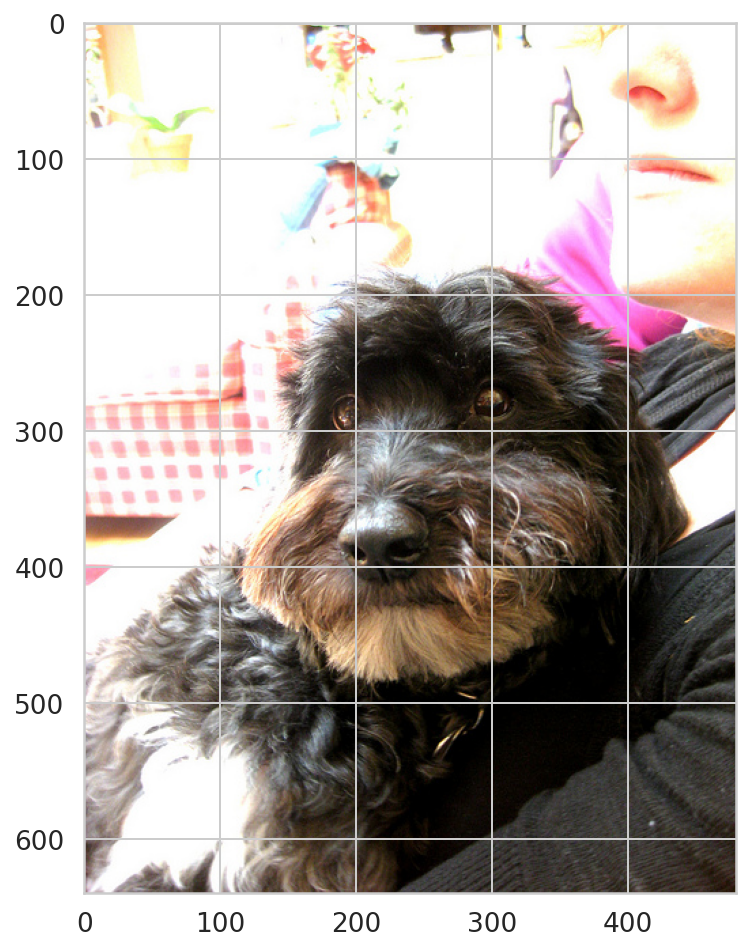

This is a picture of a ... Portuguese water dog

-----------------------------------



In [59]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[:6], dog_files[:6])):
    run_app(file)

Hello Human!


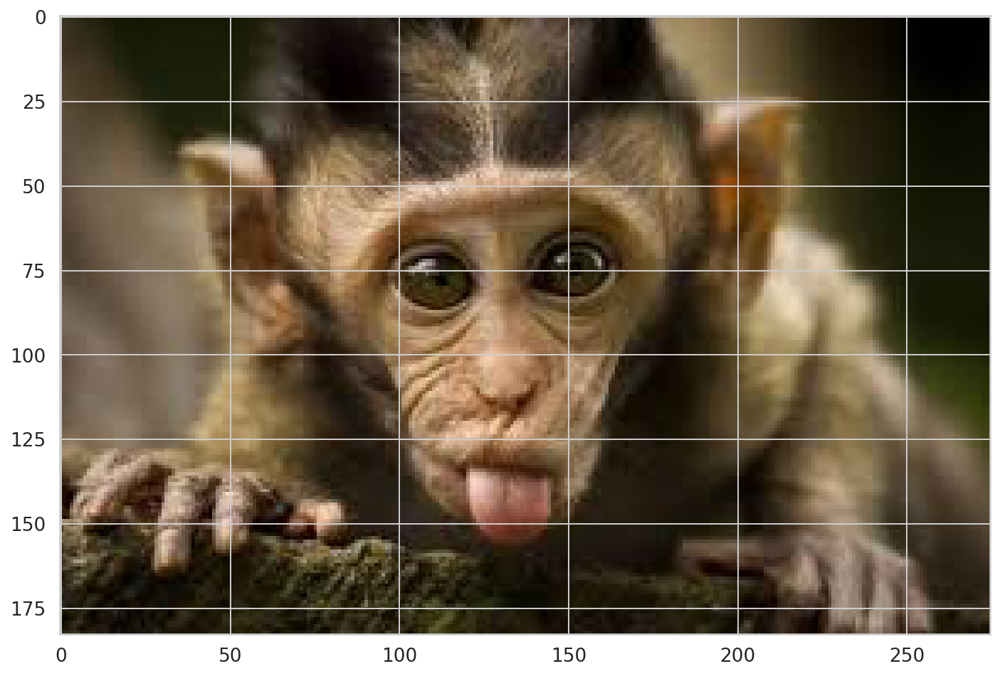

You look like a ... Chihuahua

-----------------------------------



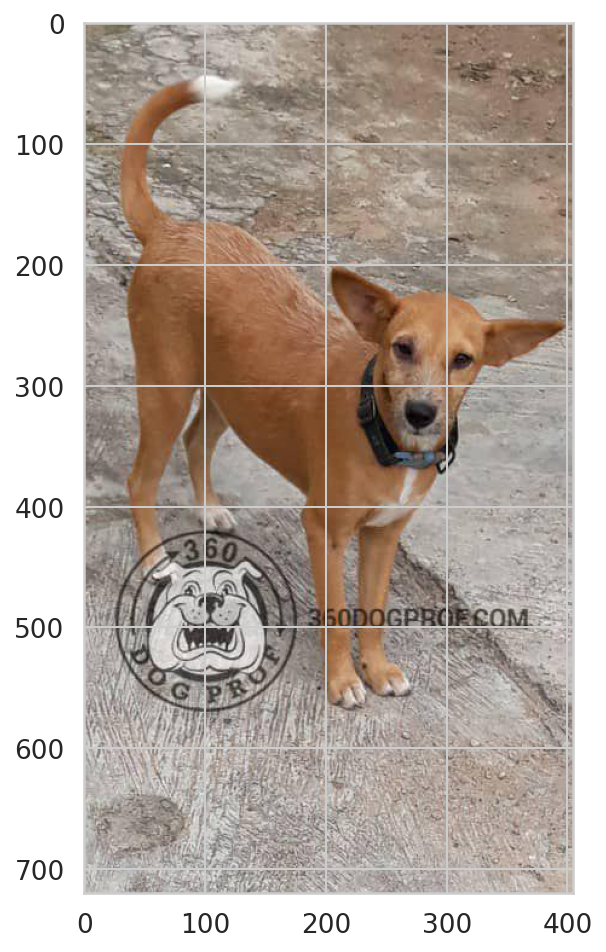

Sorry, I did not detect a human or a dog in this image.

-----------------------------------

Hello Human!


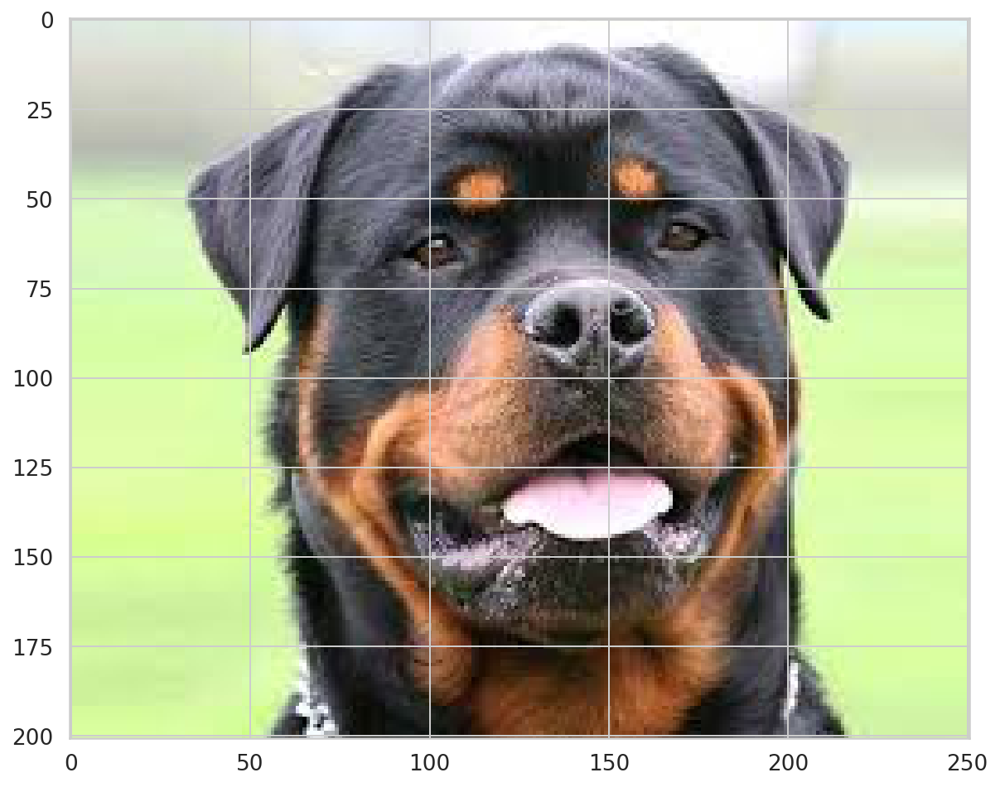

You look like a ... Beauceron

-----------------------------------

Hello Human!


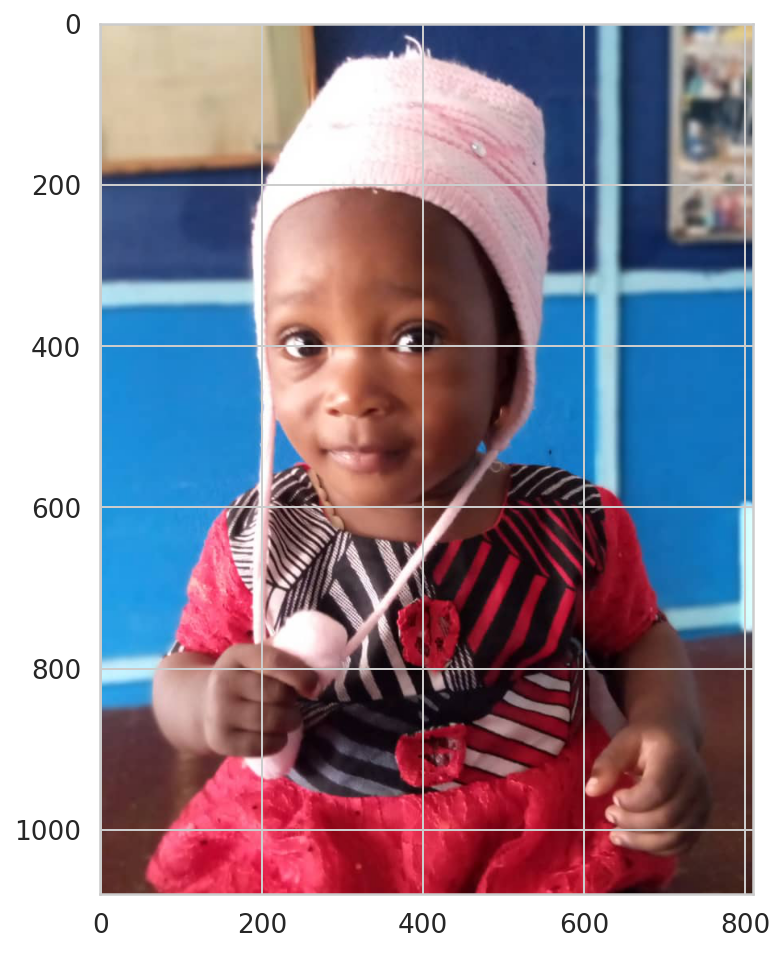

You look like a ... Dachshund

-----------------------------------

Hello Human!


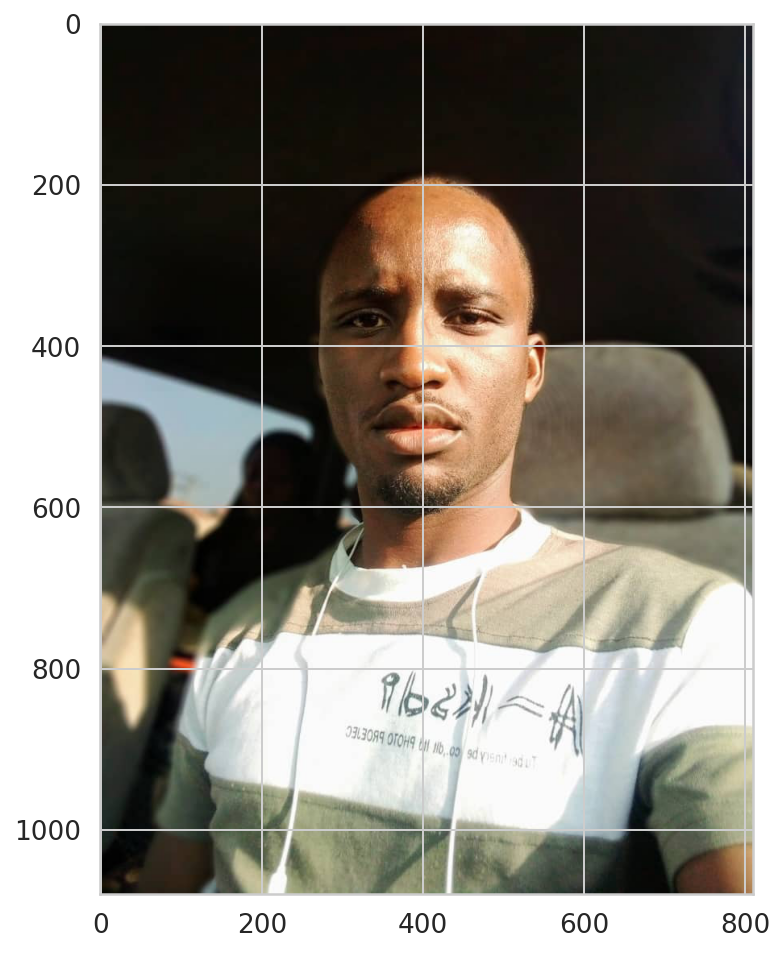

You look like a ... Brittany

-----------------------------------

Hello Human!


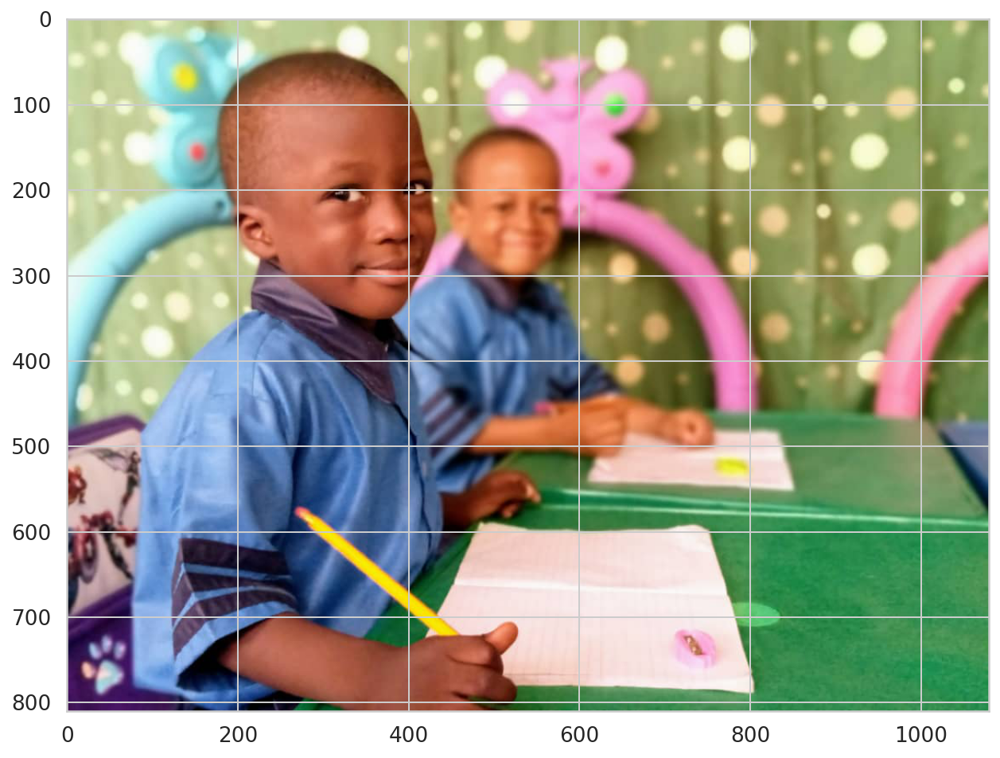

You look like a ... Dachshund

-----------------------------------



In [72]:
images = np.array(glob("Images/*"))
for file in np.hstack((images)):
    run_app(file)